# Investigate spatial outliers

We take a look at all structures that contain residues (CA atoms) with a distance to the `kissim` subpocket centers below/above a certain minimum/maximum cutoff. 

This allows us to identify outlier structures that we want to exclude from our dataset (in our `kissim` pipeline this is done with the `kissim outlier` CLI).

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path

import matplotlib.pyplot as plt
from opencadd.structure.pocket import PocketKlifs, PocketViewer
from opencadd.databases.klifs import setup_remote

from kissim.encoding import FingerprintGenerator

In [3]:
plt.style.use("seaborn")

In [4]:
HERE = Path(_dh[-1])  # noqa: F821
RESULTS = HERE / "../../results/"

In [5]:
REMOTE = setup_remote()

## Set distance minimum/maximum cutoffs

These cutoffs define spatial outliers.

In [6]:
DISTANCE_CUTOFFS = {
    "hinge_region": (1, 34),
    "dfg_region": (1, 34),
    "front_pocket": (1, 34),
    "center": (1, 34),
}
print(
    f"Use the following distance minimum/maximum cutoffs"
    f" to identify outlier structures: {DISTANCE_CUTOFFS}"
)

Use the following distance minimum/maximum cutoffs to identify outlier structures: {'hinge_region': (1, 34), 'dfg_region': (1, 34), 'front_pocket': (1, 34), 'center': (1, 34)}


## Load fingerprints

Let's load our pre-calculated fingerprint saved in a _json_ file as `FingerprintGenerator` object.

In [7]:
fingerprint_generator = FingerprintGenerator.from_json(
    RESULTS / "fingerprints.json", normalize=True
)
print(f"Number of fingerprints: {len(fingerprint_generator.data)}")

Number of fingerprints: 5229


## Get distance features

Lets load distances (from each residue to each subpocket center) for all fingerprints.

In [8]:
distances = fingerprint_generator.distances_exploded()
distances

hinge_region  dfg_region  front_pocket  \
structure_klifs_id residue_ix                                           
3833               1              12.797916   19.079002     14.099449   
                   2              11.639592   16.480698     11.631843   
                   3               9.241100   15.125705      8.280284   
                   4              10.344558   13.665124      7.234079   
                   5              12.414777   12.788165      9.115113   
...                                     ...         ...           ...   
7219               81              8.892165    7.109349      6.723064   
                   82             11.366709    6.088001     10.422721   
                   83             13.247789    5.919116     11.564625   
                   84             16.129894    9.708284     13.088131   
                   85             16.746517   10.580341     14.536907   

                                  center  
structure_klifs_id residue_ix             
3833               1           17.262196  
                   2           15.175067  
                   3           12.448807  
                   4           11.854320  
                   5           12.904052  
...                                  ...  
7219               81           3.793342  
                   82           6.788561  
                   83           9.319808  
                   84          11.473628  
                   85          11.731262  

[444465 rows x 4 columns]

In [9]:
distances.describe()

,hinge_region,dfg_region,front_pocket,center
count,436645.000000,432354.000000,436747.000000,437471.000000
mean,12.877383,13.578373,13.038914,12.009525
std,4.572543,4.867952,4.288910,3.491236
min,2.373261,0.873535,1.355564,0.890727
25%,9.575279,9.925215,9.858060,9.903019
50%,12.566267,13.300020,12.455457,12.018834
75%,15.975715,16.739207,16.172091,13.692138
max,48.594299,50.394161,40.875225,47.823181


## Get structures with extreme distances

Let's plot distance histograms (over all residue positions) per subpocket center and retain only extreme distances.

In [10]:
def extreme_distances(distances, feature_type, distance_cutoffs):

    cutoff_min = distance_cutoffs[feature_type][0]
    cutoff_max = distance_cutoffs[feature_type][1]

    features = distances[feature_type]
    range_full = round(features.max() - features.min(), 2)
    features_min = features[features < cutoff_min]
    features_max = features[features > cutoff_max]
    range_min_max = cutoff_max - cutoff_min
    n_structures_below_min = len(features_min.reset_index()["structure_klifs_id"].unique())
    n_structures_above_max = len(features_max.reset_index()["structure_klifs_id"].unique())
    n_residues_below_min = len(features_min.reset_index()["residue_ix"].unique())
    n_residues_above_max = len(features_max.reset_index()["residue_ix"].unique())
    range_below_min = round(features_min.max() - features_min.min(), 2)
    range_above_max = round(features_max.max() - features_max.min(), 2)

    fig, axes = plt.subplots(ncols=3, nrows=1, figsize=(20, 6))
    fig.suptitle(f"Extreme distances seen in subpocket {feature_type}", fontsize="x-large")
    axes[0].axvspan(cutoff_min, cutoff_max, color="cyan", alpha=0.1)
    features.plot(
        kind="hist",
        bins=100,
        ax=axes[0],
        title=f"All structures (full range {range_full} A, cutoff range {range_min_max} A / cyan)",
    )
    features_min.plot(
        kind="hist",
        ax=axes[1],
        title=f"Below {cutoff_min} A: #{n_structures_below_min} structures |"
        f" #{n_residues_below_min} residue positions (range {range_below_min} A)",
    )
    features_max.plot(
        kind="hist",
        ax=axes[2],
        title=f"Above {cutoff_max} A: #{n_structures_above_max} structures |"
        f" #{n_residues_above_max} residue positions (range {range_above_max} A)",
    )

    return features_min, features_max

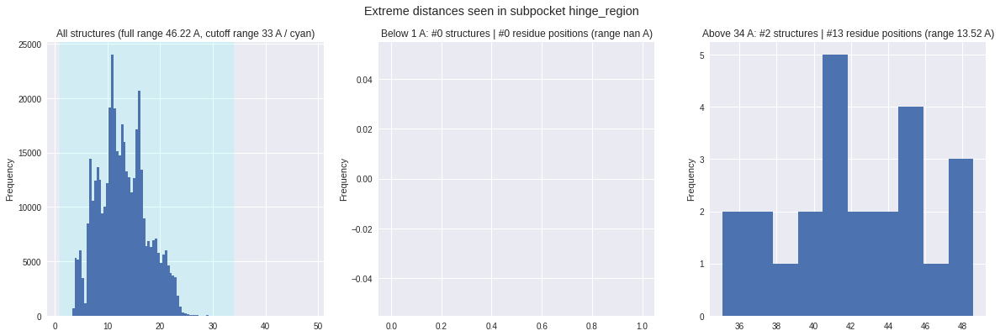

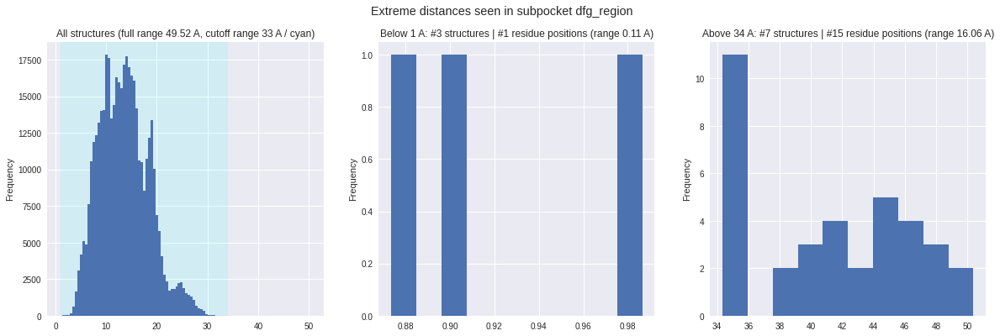

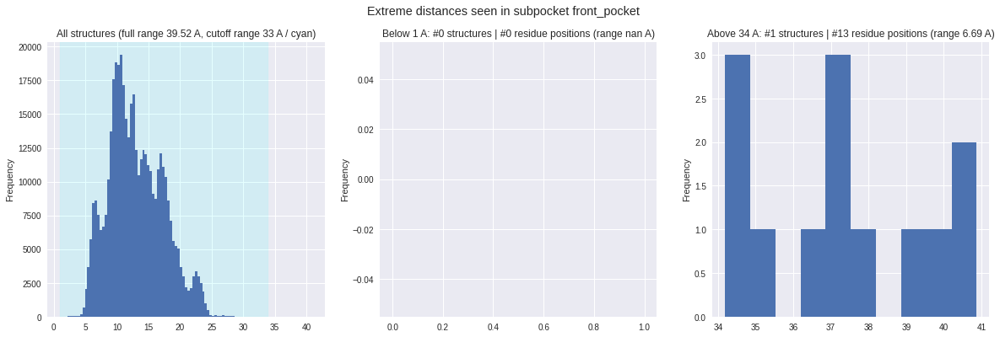

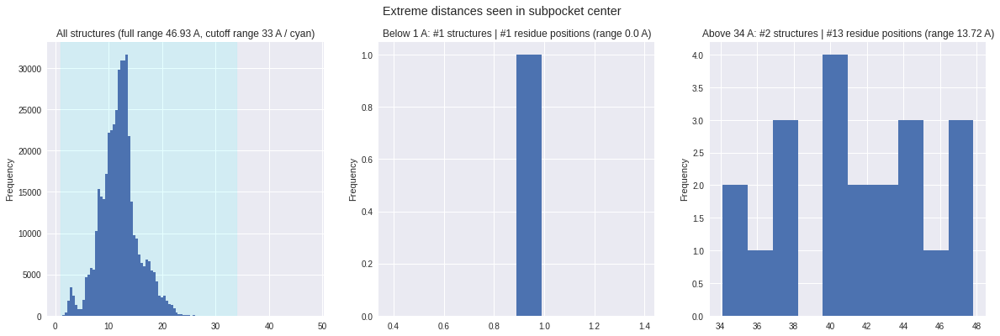

In [11]:
extreme_features = {}
for feature_type, _ in distances.items():
    features_min, features_max = extreme_distances(distances, feature_type, DISTANCE_CUTOFFS)
    extreme_features[feature_type] = (features_min, features_max)

__Note__: We will not define a minimum cutoff because it is possible that a subpocket center sits very closely to a residue CA atom and thus, in this case we would not speak of an outlier. In the following we will only focus on the long distances outliers.

### Pocket center

In [12]:
extreme_features["center"][1]

structure_klifs_id  residue_ix
24                  2             34.103951
                    4             35.146252
                    5             37.401649
                    6             37.301159
                    7             39.992100
                    8             40.320160
                    9             37.199207
                    10            36.117950
7084                1             45.400379
                    2             43.524059
                    3             40.630749
                    4             43.125862
                    5             44.290127
                    6             47.228977
                    7             47.823181
                    8             46.846550
                    9             44.158901
                    10            44.514870
                    11            41.500057
                    12            41.184532
                    13            40.873653
Name: center, dtype: float64

In [13]:
extreme_features["center"][1].reset_index().groupby("residue_ix").size()

residue_ix
1     1
2     2
3     1
4     2
5     2
6     2
7     2
8     2
9     2
10    2
11    1
12    1
13    1
dtype: int64

extreme_features["center"][1].index.get_level_values("structure_klifs_id").unique().to_list()

### Front pocket

In [14]:
extreme_features["front_pocket"][1].reset_index().groupby("residue_ix").size()

residue_ix
1     1
2     1
3     1
4     1
5     1
6     1
7     1
8     1
9     1
10    1
11    1
12    1
13    1
dtype: int64

In [15]:
extreme_features["front_pocket"][1].index.get_level_values("structure_klifs_id").unique().to_list()

[7084]

Structure already detected in "Pocket center".

### Hinge region

In [16]:
extreme_features["hinge_region"][1].reset_index().groupby("residue_ix").size()

residue_ix
1     2
2     2
3     2
4     2
5     2
6     2
7     2
8     2
9     2
10    2
11    2
12    1
13    1
dtype: int64

In [17]:
extreme_features["hinge_region"][1].index.get_level_values("structure_klifs_id").unique().to_list()

[24, 7084]

Structures already detected in "Pocket center".

### DFG region

In [18]:
extreme_features["dfg_region"][1].reset_index().groupby("residue_ix").size()

residue_ix
1     2
2     2
3     2
4     2
5     2
6     2
7     2
8     2
9     2
10    2
11    2
12    2
13    2
58    5
59    5
dtype: int64

In [19]:
extreme_features["dfg_region"][1].index.get_level_values("structure_klifs_id").unique().to_list()

[13214, 13217, 13208, 13209, 13210, 24, 7084]

## Look at structures with extremely long distances

In [20]:
extreme_structures_max = []
for subpocket_name, features in extreme_features.items():
    extreme_structures_max.extend(
        features[1].index.get_level_values("structure_klifs_id").unique()
    )
extreme_structures_max = set(extreme_structures_max)

print(f"Structures with extremly long distances: {extreme_structures_max}")

Structures with extremly long distances: {13217, 7084, 13208, 24, 13209, 13210, 13214}


In [22]:
viewer = PocketViewer()
for structure_klifs_id in extreme_structures_max:
    pocket = PocketKlifs.from_structure_klifs_id(structure_klifs_id)
    viewer.add_pocket(pocket)
viewer.viewer.display(gui=True)

NGLWidget(gui_style='ngl')

In [25]:
viewer.viewer.render_image(trim=True, factor=1, transparent=True);

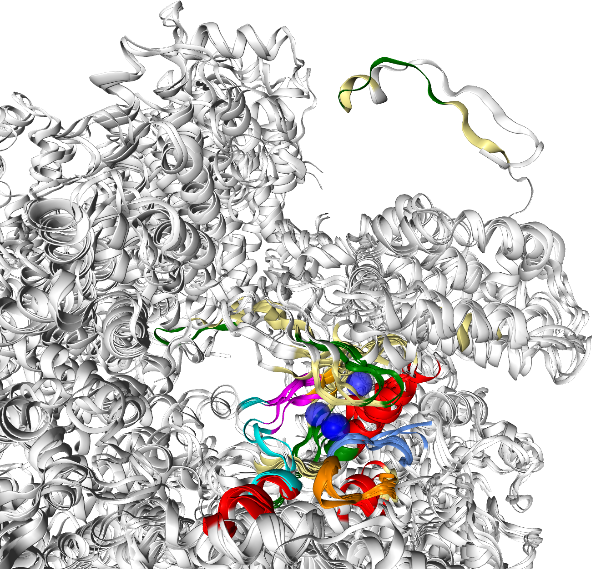

In [26]:
viewer.viewer._display_image()